#### Imports

In [68]:
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
from scipy.stats import zscore
import seaborn as sns
import pandas as pd
import numpy as np
%matplotlib inline

#### Downloading the dataset from OpenData Portal

In [4]:
!curl https://opendata.cern.ch/record/328/files/atlas-higgs-challenge-2014-v2.csv.gz -o atlas-higgs-challenge-2014-v2.csv.gz
!gunzip -f atlas-higgs-challenge-2014-v2.csv.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
M      0  0:00:05  0:00:05 --:--:-- 14.9M   0  0:00:06  0:00:05  0:00:01 10.9M


#### Loading the dataset

In [5]:
df = pd.read_csv('atlas-higgs-challenge-2014-v2.csv')
df.head()

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label,KaggleSet,KaggleWeight
0,100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,...,2.150,0.444,46.062,1.24,-2.475,113.497,0.000814,s,t,0.002653
1,100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,...,0.725,1.158,-999.000,-999.00,-999.000,46.226,0.681042,b,t,2.233584
2,100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,...,2.053,-2.028,-999.000,-999.00,-999.000,44.251,0.715742,b,t,2.347389
3,100003,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,...,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000,1.660654,b,t,5.446378
4,100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,...,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,1.904263,b,t,6.245333


In [52]:
df['Label'] = (df['Label'] == 's').astype(int)

In [76]:
feature_columns = [
    'DER_mass_MMC', 'DER_mass_transverse_met_lep',
    'DER_mass_vis', 'DER_pt_h', 'DER_deltaeta_jet_jet', 'DER_mass_jet_jet',
    'DER_prodeta_jet_jet', 'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_sum_pt',
    'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality',
    'DER_lep_eta_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
    'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi',
    'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_pt',
    'PRI_jet_leading_eta', 'PRI_jet_leading_phi', 'PRI_jet_subleading_pt',
    'PRI_jet_subleading_eta', 'PRI_jet_subleading_phi', 'PRI_jet_all_pt'
]

In [77]:
training_data = df[df['KaggleSet'] == 't']

X = training_data[feature_columns]
y = training_data['Label']
X.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt
0,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,197.760,...,-0.277,258.733,2,67.435,2.150,0.444,46.062,1.24,-2.475,113.497
1,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,125.157,...,-1.916,164.546,1,46.226,0.725,1.158,-999.000,-999.00,-999.000,46.226
2,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,197.814,...,-2.186,260.414,1,44.251,2.053,-2.028,-999.000,-999.00,-999.000,44.251
3,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,75.968,...,0.060,86.062,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000
4,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,57.983,...,-0.871,53.131,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,0.000


In [89]:
test_data = df[df['KaggleSet'] == 'b']
X_test = test_data[feature_columns]
y_test = test_data['Label']

In [79]:
print(X.isnull().sum())

DER_mass_MMC                   0
DER_mass_transverse_met_lep    0
DER_mass_vis                   0
DER_pt_h                       0
DER_deltaeta_jet_jet           0
DER_mass_jet_jet               0
DER_prodeta_jet_jet            0
DER_deltar_tau_lep             0
DER_pt_tot                     0
DER_sum_pt                     0
DER_pt_ratio_lep_tau           0
DER_met_phi_centrality         0
DER_lep_eta_centrality         0
PRI_tau_pt                     0
PRI_tau_eta                    0
PRI_tau_phi                    0
PRI_lep_pt                     0
PRI_lep_eta                    0
PRI_lep_phi                    0
PRI_met                        0
PRI_met_phi                    0
PRI_met_sumet                  0
PRI_jet_num                    0
PRI_jet_leading_pt             0
PRI_jet_leading_eta            0
PRI_jet_leading_phi            0
PRI_jet_subleading_pt          0
PRI_jet_subleading_eta         0
PRI_jet_subleading_phi         0
PRI_jet_all_pt                 0
dtype: int

### Exploratory Data Analysis (EDA)

#### Summary Statistics

In [80]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
DER_mass_MMC,250000.0,-49.023079,406.345647,-999.000,78.10075,105.0120,130.60625,1192.026
DER_mass_transverse_met_lep,250000.0,49.239819,35.344886,0.000,19.24100,46.5240,73.59800,690.075
DER_mass_vis,250000.0,81.181982,40.828691,6.329,59.38875,73.7520,92.25900,1349.351
DER_pt_h,250000.0,57.895962,63.655682,0.000,14.06875,38.4675,79.16900,2834.999
DER_deltaeta_jet_jet,250000.0,-708.420675,454.480565,-999.000,-999.00000,-999.0000,0.49000,8.503
DER_mass_jet_jet,250000.0,-601.237051,657.972302,-999.000,-999.00000,-999.0000,83.44600,4974.979
DER_prodeta_jet_jet,250000.0,-709.356603,453.019877,-999.000,-999.00000,-999.0000,-4.59300,16.690
DER_deltar_tau_lep,250000.0,2.373100,0.782911,0.208,1.81000,2.4915,2.96100,5.684
DER_pt_tot,250000.0,18.917332,22.273494,0.000,2.84100,12.3155,27.59100,2834.999
DER_sum_pt,250000.0,158.432217,115.706115,46.104,77.55000,120.6645,200.47825,1852.462


#### Data Distribution Graphs

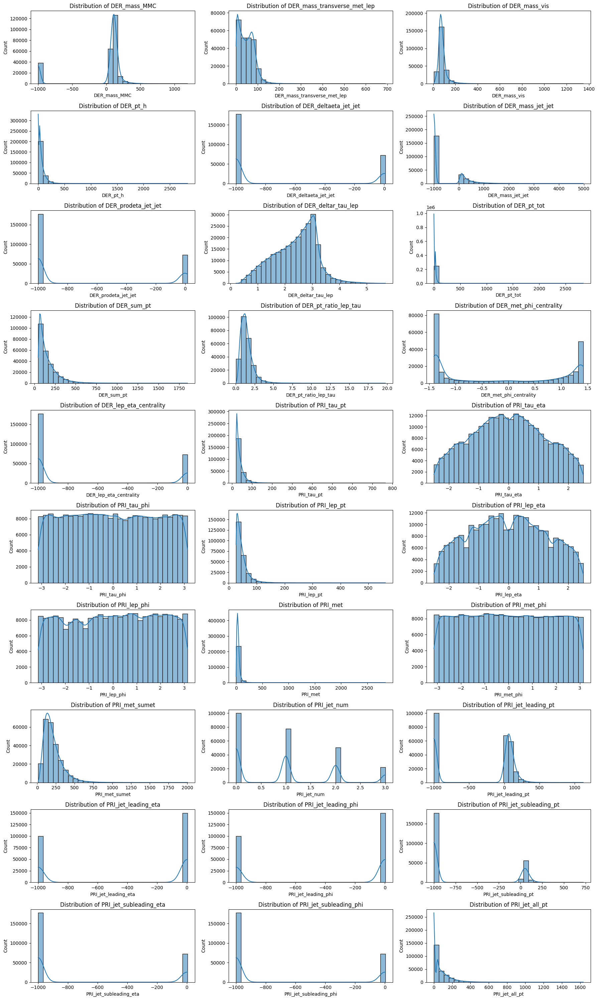

In [81]:
# Define the number of columns per row
num_cols = 3
num_features = len(X.columns)
num_rows = (num_features + num_cols - 1) // num_cols  # Calculate required rows

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 3 * num_rows))

# Flatten axes array to simplify indexing, handles both 1D and 2D cases
axes = axes.flatten()

# Plot each feature in a separate subplot
for i, col in enumerate(feature_columns):
    sns.histplot(X[col], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')

# Remove any empty subplots (if number of features isn't a multiple of num_cols)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

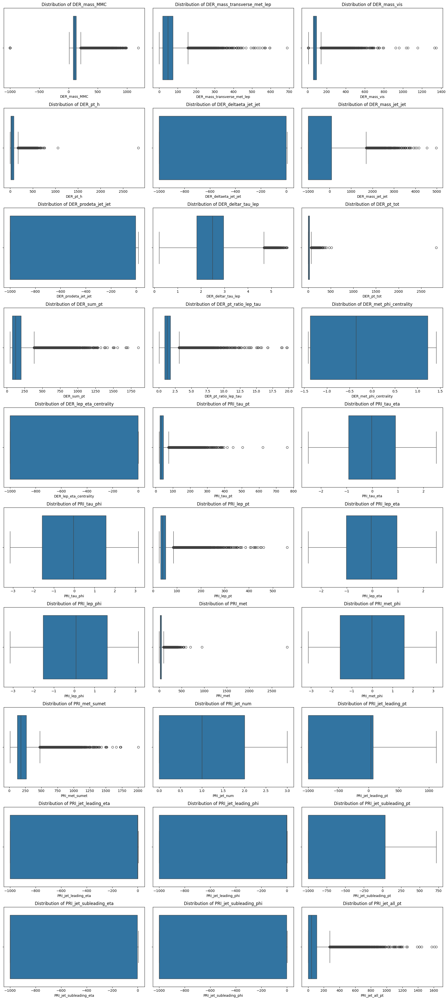

In [82]:
# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows))

# Flatten axes array to simplify indexing, handles both 1D and 2D cases
axes = axes.flatten()

# Plot each feature in a separate subplot
for i, col in enumerate(feature_columns):
    sns.boxplot(x=X[col], ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')

# Remove any empty subplots (if number of features isn't a multiple of num_cols)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

#### Feature Relationships and Trends

In [26]:
sns.pairplot(X)
plt.show()

#### Correlation Analysis

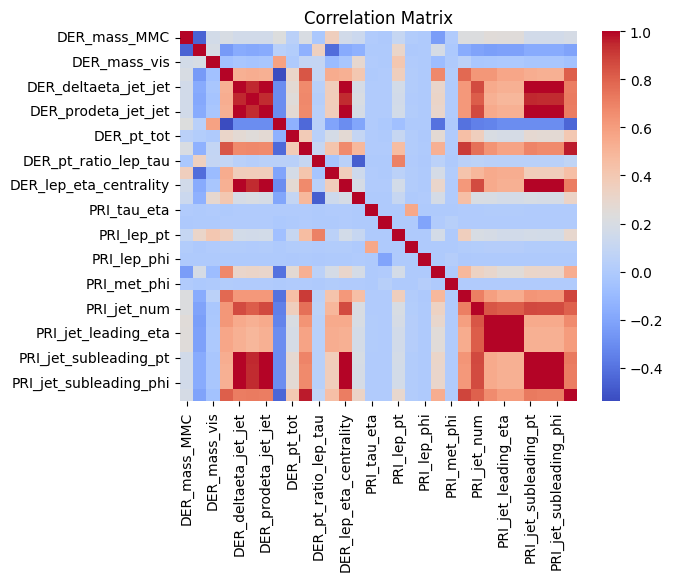

In [83]:
corr_matrix = X.corr()
sns.heatmap(corr_matrix, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

#### Outlier Detection

##### IQR (Interquartile) Method

In [84]:
Q1 = X.quantile(0.25)
Q3 = X.quantile(0.75)
IQR = Q3 - Q1
outliers = X[((X < (Q1 - 1.5 * IQR)) | (X > (Q3 + 1.5 * IQR))).any(axis=1)]
print(len(outliers))

86384


#### PCA

In [86]:
scaler = StandardScaler()
X = scaler.fit_transform(X)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

print(f'Explained variance ratio: {pca.explained_variance_ratio_}')

Explained variance ratio: [0.4089089 0.0789593]


## Model

In [87]:
print(f"X = {X.shape}")
print(f"y = {y.shape}")

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"X_train = {X_train.shape}, y_train = {y_train.shape}")
print(f"X_val = {X_val.shape}, y_val = {y_val.shape}")

X = (250000, 30)
y = (250000,)
X_train = (200000, 30), y_train = (200000,)
X_val = (50000, 30), y_val = (50000,)


In [105]:
# Define the XGBoost classifier
xgb_classifier = XGBClassifier(
    objective='binary:logistic',   # Binary classification
    eval_metric='logloss',         # Logarithmic loss
    learning_rate=0.1,            # Learning rate
    n_estimators=100,             # Number of boosting rounds
    max_depth=3,                  # Depth of the tree
    random_state=42
)

# Define the evaluation set for validation
eval_set = [(X_train, y_train), (X_val, y_val)]

# Train the model with early stopping based on validation performance
xgb_classifier.fit(
    X_train, y_train,
    eval_set=eval_set,           # Validation set
    verbose=True,                # Print evaluation results for each round
)

print('model training complete')

[0]	validation_0-logloss:0.61368	validation_1-logloss:0.61083
[1]	validation_0-logloss:0.58793	validation_1-logloss:0.58524
[2]	validation_0-logloss:0.56770	validation_1-logloss:0.56525
[3]	validation_0-logloss:0.54987	validation_1-logloss:0.54745
[4]	validation_0-logloss:0.53445	validation_1-logloss:0.53209
[5]	validation_0-logloss:0.52113	validation_1-logloss:0.51876
[6]	validation_0-logloss:0.50847	validation_1-logloss:0.50627
[7]	validation_0-logloss:0.49908	validation_1-logloss:0.49705
[8]	validation_0-logloss:0.49029	validation_1-logloss:0.48831
[9]	validation_0-logloss:0.48110	validation_1-logloss:0.47920
[10]	validation_0-logloss:0.47365	validation_1-logloss:0.47177
[11]	validation_0-logloss:0.46702	validation_1-logloss:0.46520
[12]	validation_0-logloss:0.46064	validation_1-logloss:0.45888
[13]	validation_0-logloss:0.45540	validation_1-logloss:0.45364
[14]	validation_0-logloss:0.45083	validation_1-logloss:0.44897
[15]	validation_0-logloss:0.44708	validation_1-logloss:0.44513
[1

In [106]:
y_pred = xgb_classifier.predict(X_test)

In [107]:
# Evaluate the model (Accuracy)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:\n', conf_matrix)

Accuracy: 0.66
Confusion Matrix:
 [[65956    19]
 [34022     3]]
